In [1]:
import os

from IPython.display import Image as DisplayImage
import numpy as np
from PIL import Image
import torch.utils.data as data
from torchvision import datasets
from torchvision.io import decode_image
import torchvision.utils as vutils
from tqdm.auto import tqdm

import helper_utils

In [2]:
ox3_pet_data_path = './oxford3pet_data'
if os.path.exists(ox3_pet_data_path) and os.path.isdir(ox3_pet_data_path):
    ox3_pet_download = False  # Data folder exists, will be loaded from
else:
    ox3_pet_download = True  # Data folder doesn't exist, will be downloaded

In [4]:
image = Image.open('./images/mangoes.jpg')

In [5]:
print("Original PIL Image Dimensions : ", image.size)
print(f"The maximum pixxel value is : {image.getextrema()[0][1]}, and the minimum is : {image.getextrema()[0][0]}")

Original PIL Image Dimensions :  (2048, 2048)
The maximum pixxel value is : 255, and the minimum is : 0


In [7]:
import torchvision.transforms as transforms
image_tensor = transforms.ToTensor()(image)
print(f"Dimensions after converting to a tensor : {image_tensor.shape}")
print(f"The maximum pixel value is : {image_tensor.max()}, and minimum pixel value is : {image_tensor.min()}")

Dimensions after converting to a tensor : torch.Size([3, 2048, 2048])
The maximum pixel value is : 1.0, and minimum pixel value is : 0.0


In [11]:
image_pillow = transforms.ToPILImage()(image_tensor)
print("Dimensions after converting to Pillow : ", image_pillow.size)

Dimensions after converting to Pillow :  (2048, 2048)


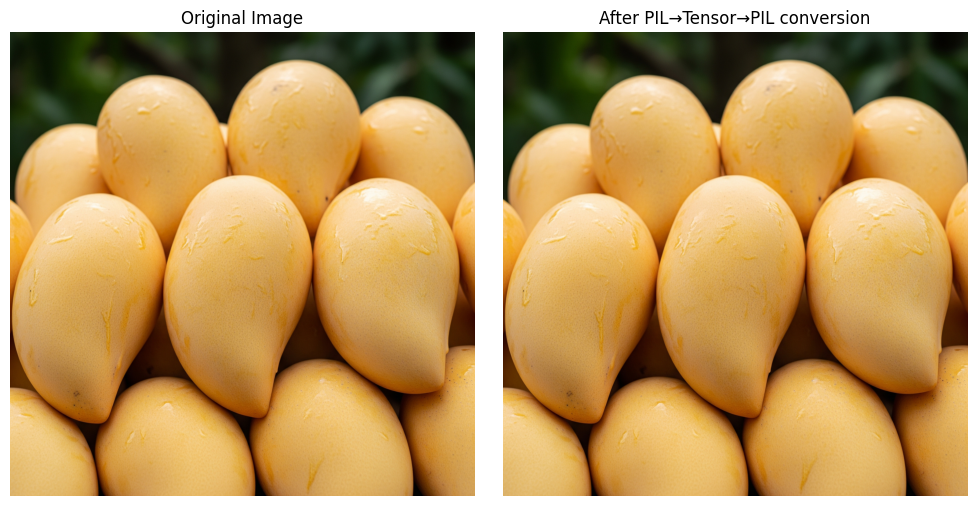

In [15]:
helper_utils.show_images([image, image_pillow], titles=("Original Image", "After PIL→Tensor→PIL conversion"))

Image tensor dimensions is : torch.Size([3, 2048, 2048])
The maximum pixel values is : 1.0, and the minimum value is 0.0



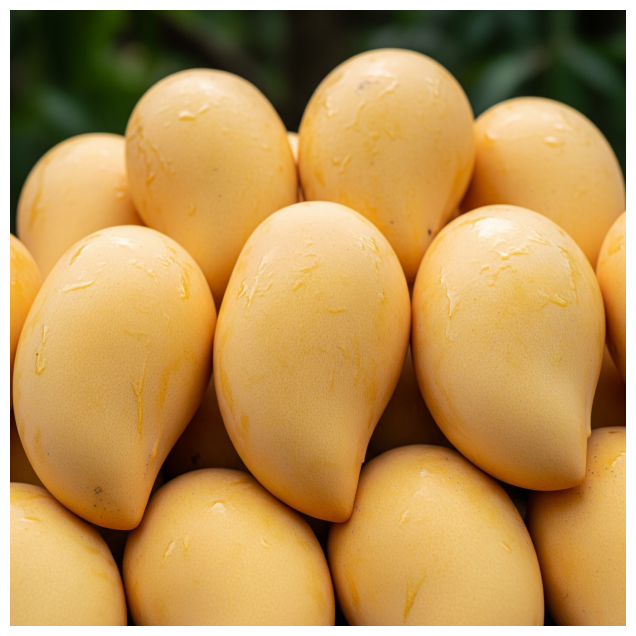

In [17]:
grid = vutils.make_grid(tensor=image_tensor, nrow=3, padding=5, normalize=True)
print(f"Image tensor dimensions is : {grid.shape}")
print(f"The maximum pixel values is : {grid.max()}, and the minimum value is {grid.min()}\n")
helper_utils.display_grid(grid)

In [18]:
image_path = "./fruits_grid.png"

In [19]:
vutils.save_image(tensor=grid, fp=image_path)

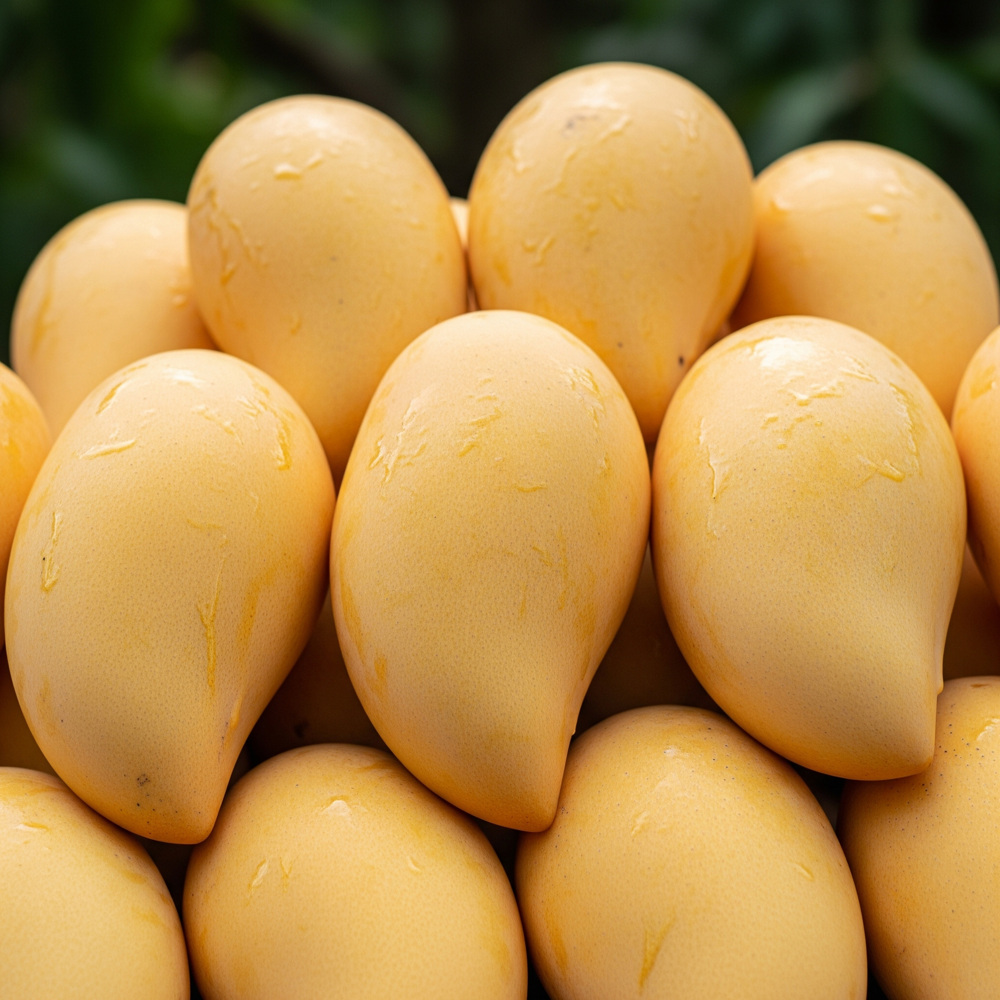

In [20]:
DisplayImage(image_path)

In [21]:
original_image = Image.open('./images/strawberries.jpg')

In [22]:
resize_transform = transforms.Resize(size=50)
resized_image = resize_transform(original_image)

Original Dimensions : (2048, 2048)
Resized Dimensions : (50, 50)



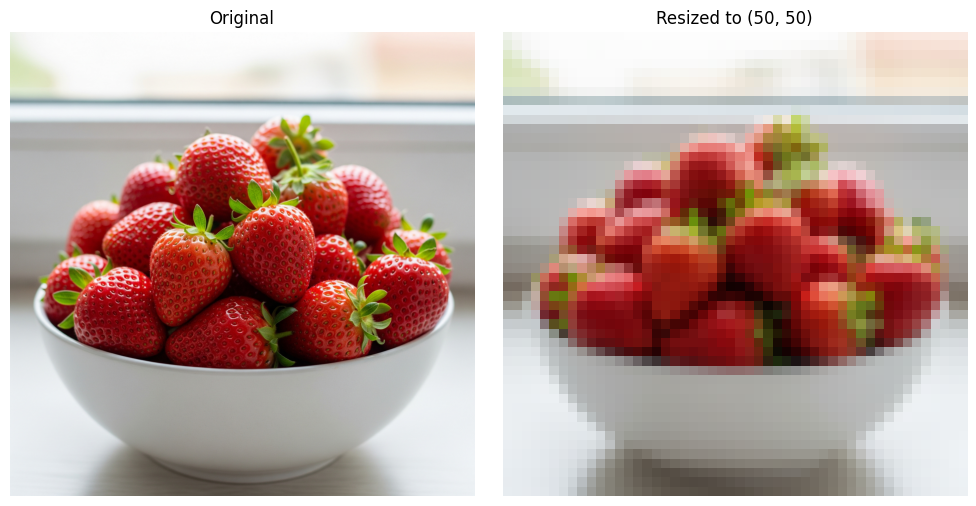

In [23]:
print(f"Original Dimensions : {original_image.size}")
print(f"Resized Dimensions : {resized_image.size}\n")
helper_utils.show_images(
    images = [original_image, resized_image],
    titles = ("Original", "Resized to (50, 50)")
)

In [24]:
centercrop_transform = transforms.CenterCrop(size=256)
cropped_image = centercrop_transform(original_image)

Original Dimensions : (2048, 2048)
Cropped Dimensions : (256, 256)



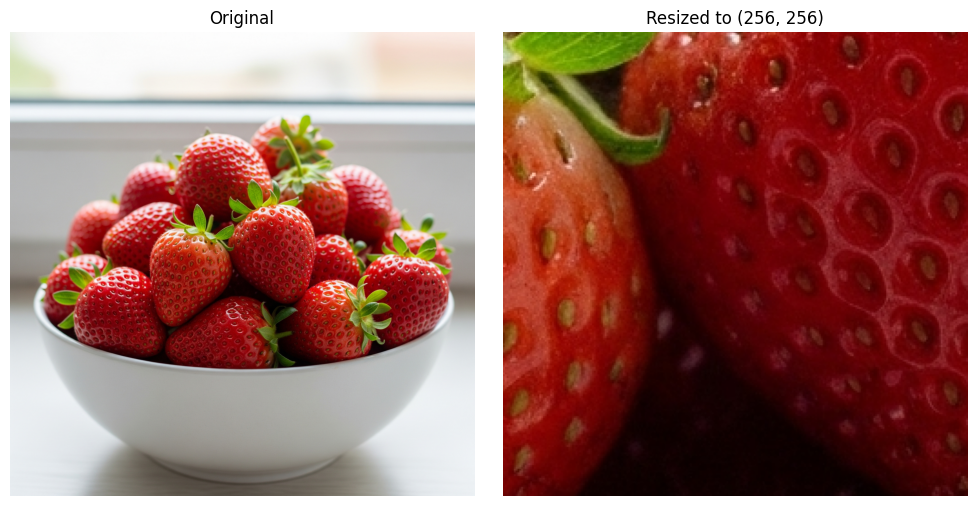

In [25]:
print(f"Original Dimensions : {original_image.size}")
print(f"Cropped Dimensions : {cropped_image.size}\n")
helper_utils.show_images(
    images = [original_image, cropped_image],
    titles = ("Original", "Resized to (256, 256)")
)

In [26]:
random_resized_crop_transform = transforms.RandomResizedCrop(size=224)
cropped_resized_image_1 = random_resized_crop_transform(original_image)
cropped_resized_image_2 = random_resized_crop_transform(original_image)
cropped_resized_image_3 = random_resized_crop_transform(original_image)

Original Dimensions: (2048, 2048)
RandomResizedCrop 1 Dimensions:  (224, 224)
RandomResizedCrop 2 Dimensions:  (224, 224)
RandomResizedCrop 3 Dimensions:  (224, 224)



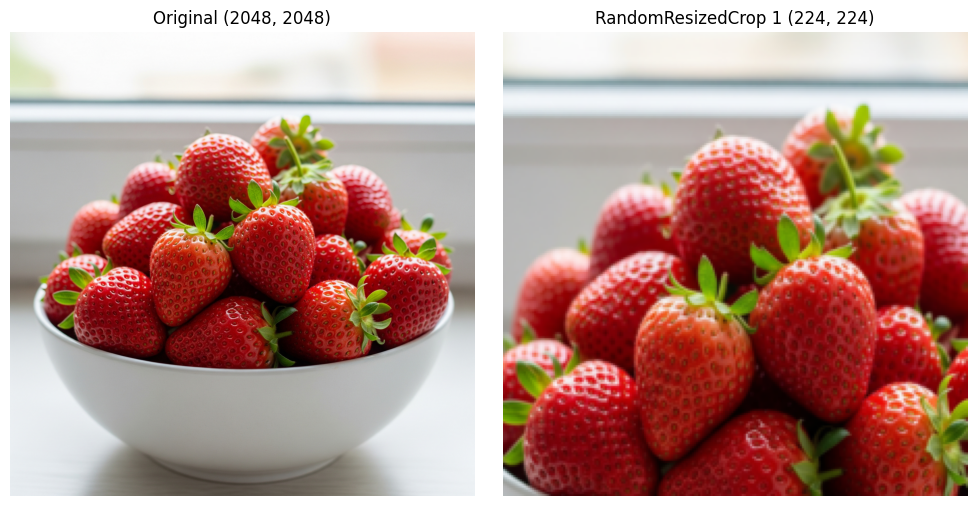

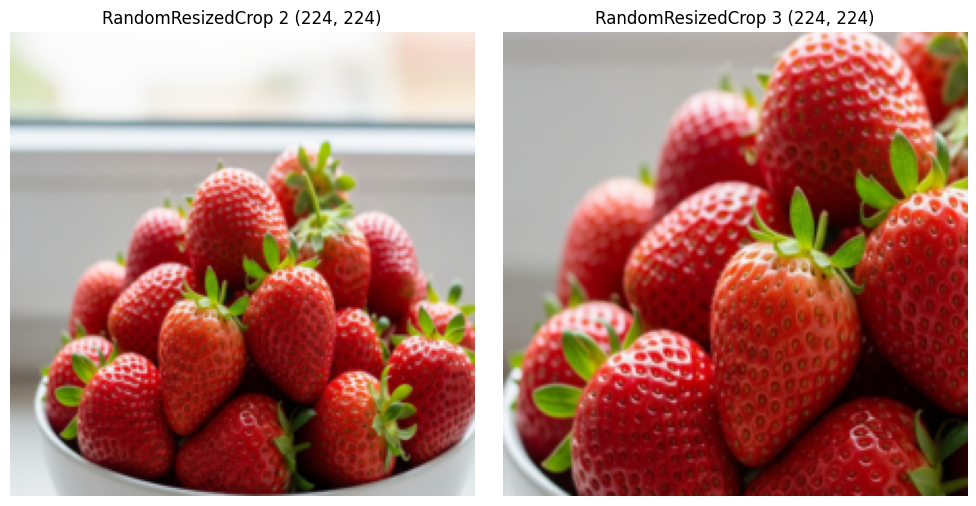

In [27]:
print(f"Original Dimensions: {original_image.size}")
print(f"RandomResizedCrop 1 Dimensions:  {cropped_resized_image_1.size}")
print(f"RandomResizedCrop 2 Dimensions:  {cropped_resized_image_2.size}")
print(f"RandomResizedCrop 3 Dimensions:  {cropped_resized_image_3.size}\n")

helper_utils.show_images(
    images = [original_image, cropped_resized_image_1],
    titles = ("Original (2048, 2048)", "RandomResizedCrop 1 (224, 224)")
)

helper_utils.show_images(
    images = [cropped_resized_image_2, cropped_resized_image_3],
     titles=("RandomResizedCrop 2 (224, 224)", "RandomResizedCrop 3 (224, 224)")
    
)

In [34]:
flip_transform = transforms.RandomHorizontalFlip(p=1.0)
flipped_image = flip_transform(original_image)

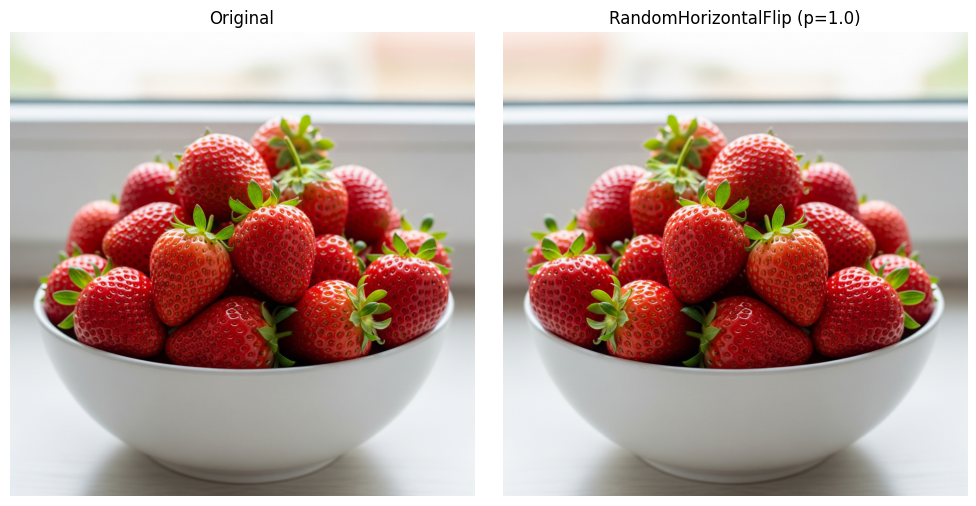

In [35]:
helper_utils.show_images(
    images=[original_image, flipped_image],
    titles=("Original", "RandomHorizontalFlip (p=1.0)")
)

In [40]:
jitter_transform = transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5)
jittered_image = jitter_transform(original_image)

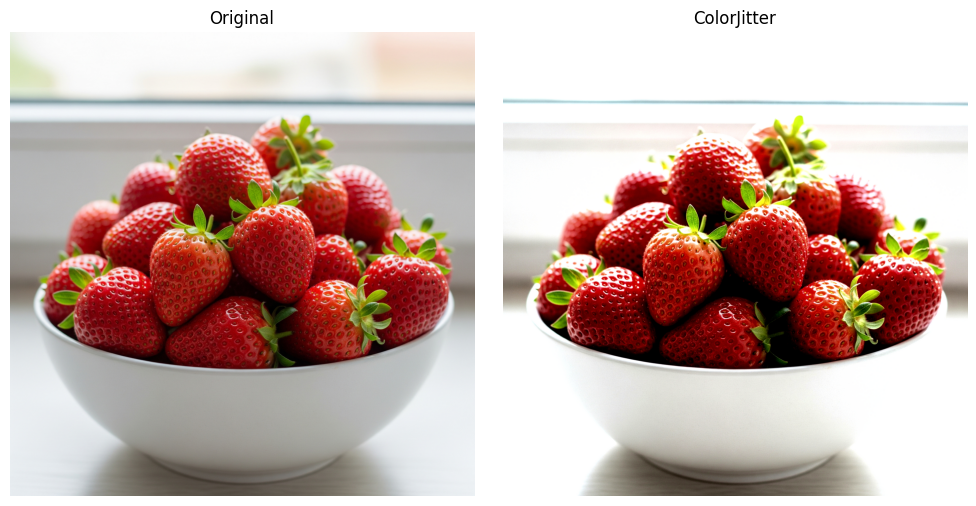

In [41]:
helper_utils.show_images(
    images=[original_image, jittered_image],
    titles=("Original", "ColorJitter")
)

In [43]:
class SaltAndPepperNoise:
    """
    A custom transform to add salt and pepper noise to a PIL image.

    Args:
        salt_vs_pepper (float): The ratio of salt to pepper noise.
                                (e.g., 0.5 is an equal amount of each).
        amount (float): The total proportion of pixels to be affected by noise.
    """
    def __init__(self, salt_vs_pepper=0.5, amount=0.04):
        self.s_vs_p = salt_vs_pepper
        self.amount = amount

    def __call__(self, image):
        output = np.copy(np.array(image))
        num_salt = np.ceil(self.amount * image.size[0] * image.size[1] * self.s_vs_p)
        coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.size]
        output[coords[1], coords[0]] = 255  
        num_pepper = np.ceil(self.amount * image.size[0] * image.size[1] * (1.0 - self.s_vs_p))
        coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.size]
        output[coords[1], coords[0]] = 0

        return Image.fromarray(output)

    def __repr__(self):
        return self.__class__.__name__ + f'(salt_vs_pepper={self.s_vs_p}, amount={self.amount})'

In [44]:
sp_transform = SaltAndPepperNoise(salt_vs_pepper=0.5, amount=0.5)
sp_image = sp_transform(original_image)

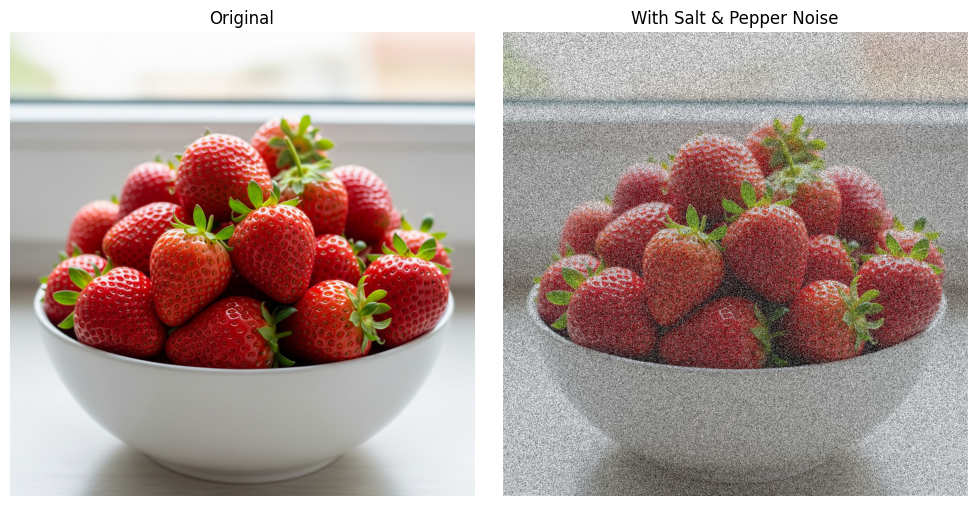

In [47]:
helper_utils.show_images(
    images=[original_image, sp_image],
    titles=("Original", "With Salt & Pepper Noise")
)

In [46]:
tensor_image = transforms.ToTensor()(original_image)
normalize_transforms = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)
normalized_tensor = normalize_transforms(tensor_image)

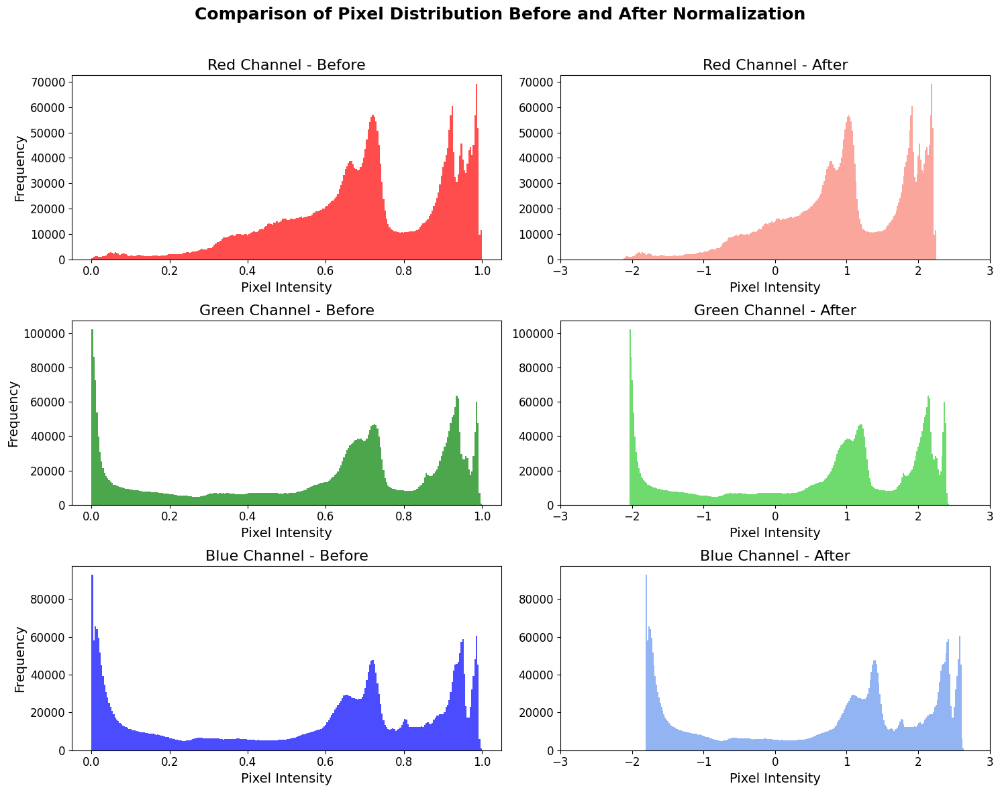

In [51]:
helper_utils.plot_histogram(tensor_image, normalized_tensor, "Comparison of Pixel Distribution Before and After Normalization")

In [62]:
def calculate_mean_std(dataset):
    """
    Calculates the mean and standard deviation of a PyTorch dataset.

    Args:
        dataset (torch.utils.data.Dataset): The dataset for which to
                                            calculate the stats. It should
                                            return image tensors.

    Returns:
        (torch.Tensor, torch.Tensor): A tuple containing the mean and
                                      standard deviation tensors, each of
                                      shape (C,).
    """
    loader = data.DataLoader(dataset, batch_size=64, shuffle=False, num_workers=0)

    channel_sum = torch.zeros(3)
    channel_sum_sq = torch.zeros(3)
    num_pixels = 0

    for images, _ in tqdm(loader, desc="Calculating Dataset Stats"):
        num_pixels += images.size(0) * images.size(2) * images.size(3)
        channel_sum += images.sum(dim=[0, 2, 3])
        channel_sum_sq += (images ** 2).sum(dim=[0, 2, 3])

    mean = channel_sum / num_pixels
    std = (channel_sum_sq / num_pixels - mean ** 2) ** 0.5

    return mean, std

In [64]:
simple_transform = transforms.Compose([
    transforms.Resize((100, 100)),
    transforms.ToTensor()
])

# Load the OxfordIIITPet dataset, applying the simple transform to each image
my_dataset = datasets.OxfordIIITPet(root=ox3_pet_data_path,
                                    split='test',                 # Specify using the test set
                                    download=ox3_pet_download,    # Download if not already present
                                    transform=simple_transform    # Apply the defined transformations
                                   )

# Compute the mean and standard deviation for the dataset
dataset_mean, dataset_std = calculate_mean_std(my_dataset)

print(f"\nCalculation Complete.")
print(f"Dataset Mean: {dataset_mean}")
print(f"Dataset Std:  {dataset_std}")

Calculating Dataset Stats:   0%|          | 0/2 [00:00<?, ?it/s]


Calculation Complete.
Dataset Mean: tensor([0.4884, 0.4621, 0.4012])
Dataset Std:  tensor([0.2575, 0.2559, 0.2667])


In [67]:
base_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])

fullaugmentation_pipeline = transforms.Compose([
    transforms.RandomResizedCrop(size=224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.05, contrast=0.05),
    SaltAndPepperNoise(amount=0.001),
    transforms.ToTensor(),
    transforms.Normalize(mean=dataset_mean, std=dataset_std)
])

In [68]:
original_dataset = datasets.OxfordIIITPet(root=ox3_pet_data_path, 
                                          split='test',
                                          download=ox3_pet_download,
                                          transform=base_transform
                                         )

original_loader = data.DataLoader(original_dataset, batch_size=32, shuffle=True)

Original Un-augmented Batch:



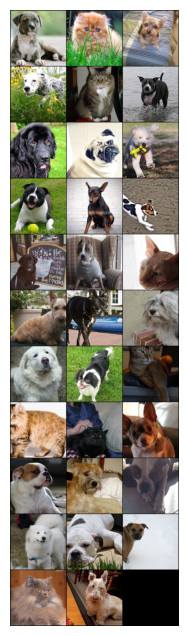

In [70]:
original_images, _ = next(iter(original_loader))
grid = vutils.make_grid(original_images, nrow=3, padding=2) 

print("Original Un-augmented Batch:\n")
helper_utils.display_grid(grid)

In [ ]:
for i in range(5):   
    augmented_batch = []
    
    for img_tensor in original_images:
        img_pil = transforms.ToPILImage()(img_tensor)
        augmented_tensor = fullaugmentation_pipeline(img_pil)
        augmented_batch.append(augmented_tensor)

    final_batch = torch.stack(augmented_batch)
    grid = vutils.make_grid(final_batch, nrow=3, padding=2)
    
    print(f"\nAugmented Batch - Run #{i + 1}")
    helper_utils.display_grid(grid)


Augmented Batch - Run #1
